# House price estimation using Advanced Linear Regression

### A US-based housing company named Surprise Housing has decided to enter the Australian market. The company uses data analytics to purchase houses at a price below their actual values and flip them on at a higher price. For the same purpose, the company has collected a data set from the sale of houses in Australia.

### The company wants to know:
####       1. Which variables are significant in predicting the price of a house, and
####       2. How well those variables describe the price of a house.

In [52]:
## We have to craete a model that can predict the price of houses based on some independent features. 

In [1]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

import sklearn
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.metrics import r2_score

import warnings
warnings.filterwarnings('ignore')

## Understanding the data

In [25]:
house_dataset = pd.read_csv(r'C:\Users\Dell\OneDrive\Desktop\advanced linear regression assignment\housing data.csv')

In [26]:
house_dataset.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [6]:
house_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [7]:
house_dataset.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,...,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,...,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,...,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,...,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [8]:
house_dataset.isnull().sum()

Id                 0
MSSubClass         0
MSZoning           0
LotFrontage      259
LotArea            0
                ... 
MoSold             0
YrSold             0
SaleType           0
SaleCondition      0
SalePrice          0
Length: 81, dtype: int64

In [27]:
# dropping below clumns because they have very less rows of data out of 1460 and may lead to deviation in model 
# 1. ALley 2. PoolQC 3. MiscFeature 4. Fence
house_dataset.drop(columns=['Alley','PoolQC','Fence','MiscFeature'],axis=1,inplace=True)

In [28]:
house_dataset.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,Reg,Lvl,AllPub,Inside,...,0,0,0,0,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,Reg,Lvl,AllPub,FR2,...,0,0,0,0,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,IR1,Lvl,AllPub,Inside,...,0,0,0,0,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,IR1,Lvl,AllPub,Corner,...,272,0,0,0,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,IR1,Lvl,AllPub,FR2,...,0,0,0,0,0,12,2008,WD,Normal,250000


In [11]:
house_dataset.drop(['Id'],axis=1)

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,0,2,2008,WD,Normal,208500
1,20,RL,80.0,9600,Pave,Reg,Lvl,AllPub,FR2,Gtl,...,0,0,0,0,0,5,2007,WD,Normal,181500
2,60,RL,68.0,11250,Pave,IR1,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,0,9,2008,WD,Normal,223500
3,70,RL,60.0,9550,Pave,IR1,Lvl,AllPub,Corner,Gtl,...,272,0,0,0,0,2,2006,WD,Abnorml,140000
4,60,RL,84.0,14260,Pave,IR1,Lvl,AllPub,FR2,Gtl,...,0,0,0,0,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,60,RL,62.0,7917,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,0,8,2007,WD,Normal,175000
1456,20,RL,85.0,13175,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,0,2,2010,WD,Normal,210000
1457,70,RL,66.0,9042,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,2500,5,2010,WD,Normal,266500
1458,20,RL,68.0,9717,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,112,0,0,0,0,4,2010,WD,Normal,142125


### the dataset still contains many columns with null values. These columns are both numerical and categorical. in order to treat missing values, we will replace them with mean in numerical columns and with mode in categorical columns.

In [12]:
# we will start with identifying the numerical columns and how many of them have null values.
house_dataset.select_dtypes(include=['int64','float64']).columns

Index(['Id', 'MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual',
       'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd',
       'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF',
       'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea',
       'MiscVal', 'MoSold', 'YrSold', 'SalePrice'],
      dtype='object')

In [13]:
house_dataset.columns[house_dataset.isnull().any()]

Index(['LotFrontage', 'MasVnrType', 'MasVnrArea', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Electrical',
       'FireplaceQu', 'GarageType', 'GarageYrBlt', 'GarageFinish',
       'GarageQual', 'GarageCond'],
      dtype='object')

In [29]:
len(house_dataset.columns[house_dataset.isnull().any()])

15

In [30]:
house_dataset.select_dtypes(include='float64').columns

Index(['LotFrontage', 'MasVnrArea', 'GarageYrBlt'], dtype='object')

#### we will replace null values in above columns with their column mean. 

In [31]:
house_dataset['LotFrontage'] = house_dataset['LotFrontage'].fillna(house_dataset['LotFrontage'].mean())
house_dataset['MasVnrArea'] = house_dataset['MasVnrArea'].fillna(house_dataset['MasVnrArea'].mean())
house_dataset['GarageYrBlt'] = house_dataset['GarageYrBlt'].fillna(house_dataset['GarageYrBlt'].mean())

In [32]:
len(house_dataset.columns[house_dataset.isnull().any()])

12

In [18]:
# will repeat the same with categorical variables. 
# since the data type is only 'object', we will replace ll the categorical column's null values with their column mode.

In [33]:
house_dataset.columns[house_dataset.isnull().any()]

Index(['MasVnrType', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1',
       'BsmtFinType2', 'Electrical', 'FireplaceQu', 'GarageType',
       'GarageFinish', 'GarageQual', 'GarageCond'],
      dtype='object')

#### we will replace null values in above columns with their mode.

In [34]:
house_dataset['MasVnrType'] = house_dataset['MasVnrType'].fillna(house_dataset['MasVnrType'].mode()[0])
house_dataset['BsmtQual'] = house_dataset['BsmtQual'].fillna(house_dataset['BsmtQual'].mode()[0])
house_dataset['BsmtCond'] = house_dataset['BsmtCond'].fillna(house_dataset['BsmtCond'].mode()[0])
house_dataset['BsmtExposure'] = house_dataset['BsmtExposure'].fillna(house_dataset['BsmtExposure'].mode()[0])
house_dataset['BsmtFinType1'] = house_dataset['BsmtFinType1'].fillna(house_dataset['BsmtFinType1'].mode()[0])
house_dataset['BsmtFinType2'] = house_dataset['BsmtFinType2'].fillna(house_dataset['BsmtFinType2'].mode()[0])
house_dataset['Electrical'] = house_dataset['Electrical'].fillna(house_dataset['Electrical'].mode()[0])
house_dataset['FireplaceQu'] = house_dataset['FireplaceQu'].fillna(house_dataset['FireplaceQu'].mode()[0])
house_dataset['GarageType'] = house_dataset['GarageType'].fillna(house_dataset['GarageType'].mode()[0])
house_dataset['GarageFinish'] = house_dataset['GarageFinish'].fillna(house_dataset['GarageFinish'].mode()[0])
house_dataset['GarageQual'] = house_dataset['GarageQual'].fillna(house_dataset['GarageQual'].mode()[0])
house_dataset['GarageCond'] = house_dataset['GarageCond'].fillna(house_dataset['GarageCond'].mode()[0])

In [35]:
len(house_dataset.columns[house_dataset.isnull().any()])

0

## Data visualization

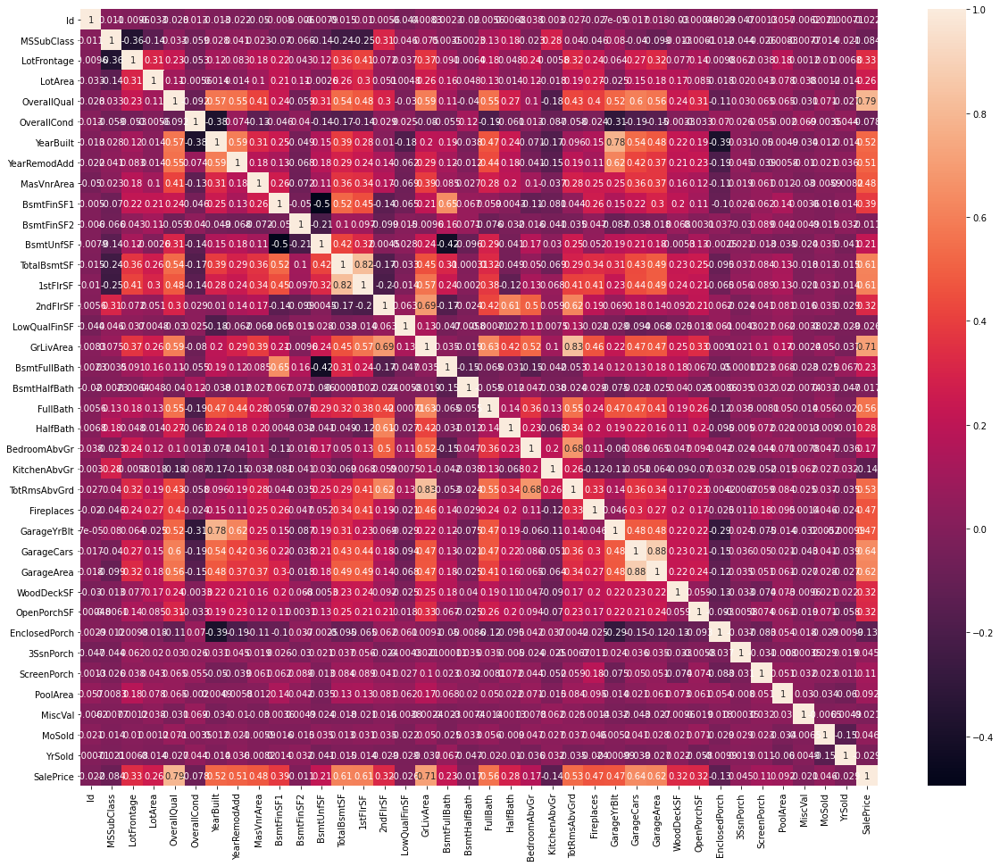

In [34]:
# plot heat map
plt.figure(figsize=(20,16))
sns.heatmap(house_dataset.corr(),annot=True)
plt.show()

#### we can see multiple features having high correlation with each other (> 0.7). We will try to remove them one by one by performing EDA.

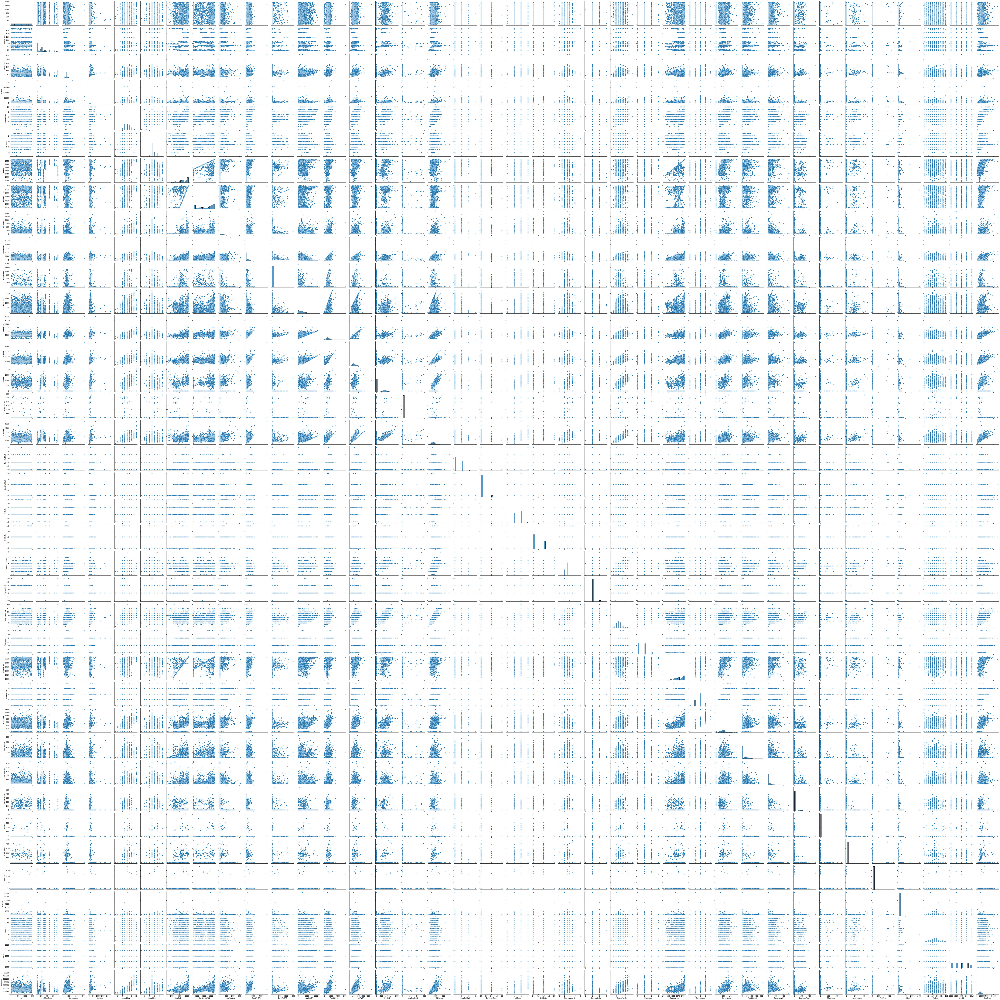

In [22]:
sns.pairplot(house_dataset)
plt.show()

In [ ]:
# above scatter plot not giving much information. 

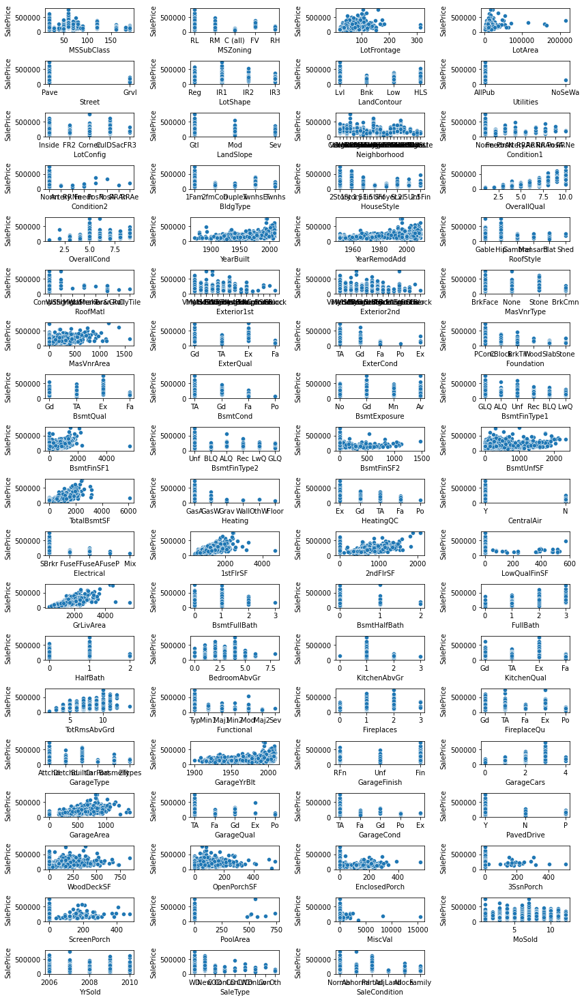

In [22]:
fig=plt.subplots(figsize=(12, 21))
i=0
for j,feature in enumerate(house_dataset.columns):
    if feature not in ['Id', 'SalePrice']:
        i+=1
        plt.subplot(20, 4, i)
        sns.scatterplot(house_dataset[feature], house_dataset['SalePrice'])
        plt.tight_layout()

###### 1. features showig positive correlation with SalePRice - LotFrontage, LotArea, BsmtFinSF1, TotalBsmtSF, 1stFlrSF, GrLivArea, GarageArea
###### 2. Year related features are showing positive correlation with SalePrice. 
###### 3. Year related features - GarageYrBlt, YrSold, YearBuilt, YearRemodAdd

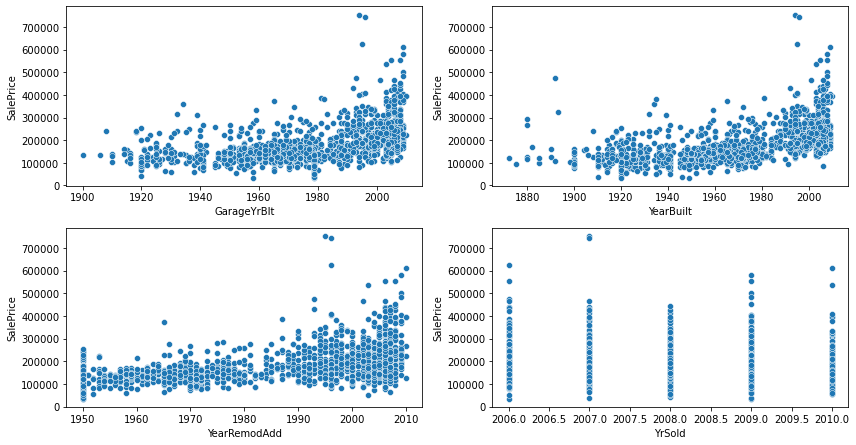

In [23]:
fig=plt.subplots(figsize=(12, 12))

for i, yr in enumerate(['GarageYrBlt','YearBuilt','YearRemodAdd', 'YrSold']):
    plt.subplot(4, 2, i+1)
    sns.scatterplot(house_dataset[yr], house_dataset['SalePrice'])
    plt.tight_layout()

###### 1. Garage built after year 2000 is adding positively to the Saleprice.
###### 2.  recently built houses have hig sale price.
###### 3. remodelled houses are attracting more value.

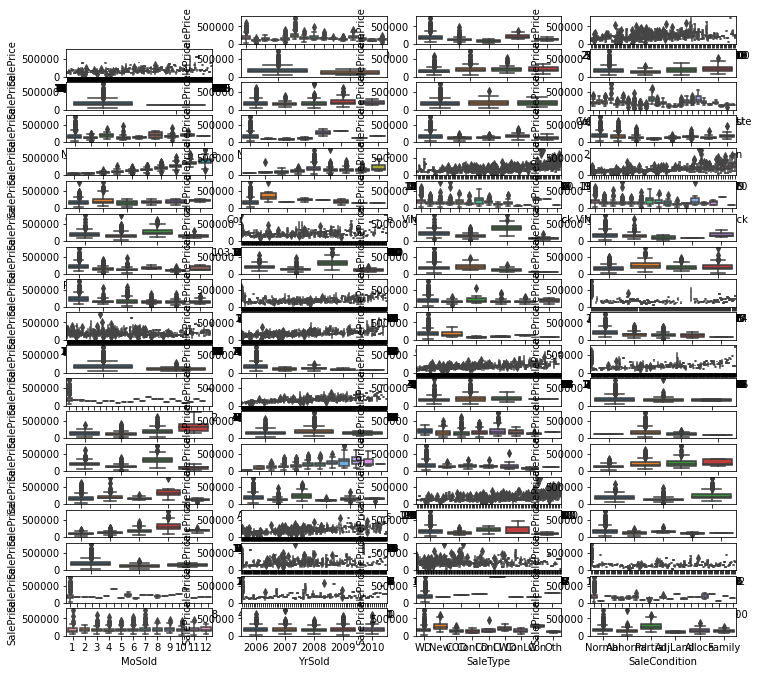

In [30]:
fig=plt.subplots(figsize=(12, 12))

for i,feature in enumerate(house_dataset.columns):
    if feature not in ['Id', 'SalePrice']:
        i+=1
        plt.subplot(20, 4, i)
        sns.boxplot(house_dataset[feature], house_dataset['SalePrice'])

In [37]:
# There are many categorical features in the dataset, which we are not able to analyse in scatter plot above
# So we will draw box plot . but before that, lets identify categorical features once again by selecting with datatype 'object'

house_data_cat = house_dataset.select_dtypes(include=['object'])
house_data_cat.columns

Index(['MSZoning', 'Street', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual',
       'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual',
       'GarageCond', 'PavedDrive', 'SaleType', 'SaleCondition'],
      dtype='object')

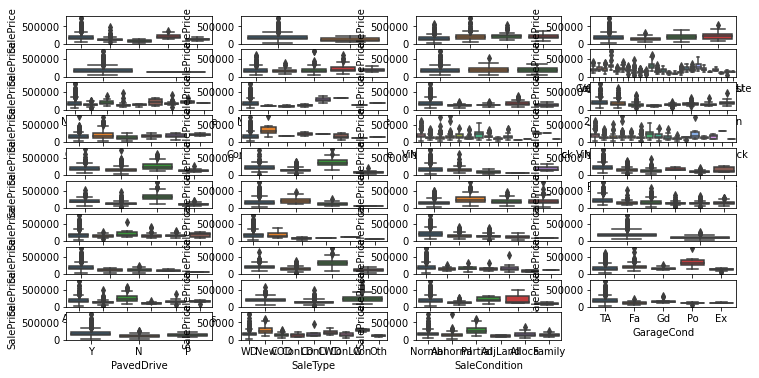

In [38]:
fig=plt.subplots(figsize=(12, 12))

for i,col in enumerate(house_data_cat.columns):
    plt.subplot(20,4, i+1)
    sns.boxplot(house_data_cat[col], house_dataset['SalePrice'] )

#### There  are 2 types of categorical variables in the dataset - ordered and unordered

In [40]:
unordered_features = ['MSZoning', 'Street', 'LandContour', 'LotConfig', 'Neighborhood', 'Condition1' , 'Condition2',
                      'BldgType', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'Foundation', 'Heating',
                      'Electrical', 'GarageType','PavedDrive', 'SaleType','SaleCondition','LotShape',
                      'Utilities', 'LandSlope', 'HouseStyle', 'CentralAir', 'Functional']
house_data_dummy = pd.get_dummies(house_dataset[unordered_features], drop_first=True)

In [41]:
house_data_dummy.shape

(1460, 153)

In [42]:
# Dropping those columns which have less than or equal to 1% of data. Took GOOGLE help here.
dummy_cols_drop = []
for less_data in house_data_dummy.columns:
    if house_data_dummy[less_data].value_counts()[0]/house_data_dummy.shape[0] >= 0.99:
        dummy_cols_drop.append(less_data)
    elif house_data_dummy[less_data].value_counts()[1]/house_data_dummy.shape[1] >= 0.99:
        dummy_cols_drop.append(less_data)
        
print(dummy_cols_drop)
print(len(dummy_cols_drop))

['MSZoning_RL', 'MSZoning_RM', 'Street_Pave', 'LandContour_Lvl', 'LotConfig_FR3', 'LotConfig_Inside', 'Neighborhood_Blueste', 'Neighborhood_NAmes', 'Neighborhood_NPkVill', 'Neighborhood_Veenker', 'Condition1_Norm', 'Condition1_PosA', 'Condition1_RRAe', 'Condition1_RRNe', 'Condition1_RRNn', 'Condition2_Feedr', 'Condition2_Norm', 'Condition2_PosA', 'Condition2_PosN', 'Condition2_RRAe', 'Condition2_RRAn', 'Condition2_RRNn', 'RoofStyle_Gable', 'RoofStyle_Gambrel', 'RoofStyle_Hip', 'RoofStyle_Mansard', 'RoofStyle_Shed', 'RoofMatl_CompShg', 'RoofMatl_Membran', 'RoofMatl_Metal', 'RoofMatl_Roll', 'RoofMatl_Tar&Grv', 'RoofMatl_WdShake', 'RoofMatl_WdShngl', 'Exterior1st_AsphShn', 'Exterior1st_BrkComm', 'Exterior1st_CBlock', 'Exterior1st_HdBoard', 'Exterior1st_ImStucc', 'Exterior1st_MetalSd', 'Exterior1st_Stone', 'Exterior1st_VinylSd', 'Exterior1st_Wd Sdng', 'Exterior2nd_AsphShn', 'Exterior2nd_Brk Cmn', 'Exterior2nd_CBlock', 'Exterior2nd_HdBoard', 'Exterior2nd_ImStucc', 'Exterior2nd_MetalSd', 'Ex

In [43]:
house_data_dummy.drop(columns = dummy_cols_drop, axis = 1, inplace = True)
house_data_dummy.shape

(1460, 60)

In [44]:
# Adding the dummy variables to the original dataframe
house_dataset = pd.concat([house_dataset,house_data_dummy],axis=1)

# Dropping the redundant columns
house_dataset = house_dataset.drop(unordered_features,axis=1)

In [45]:
house_dataset.shape

(1460, 111)

In [46]:
final_features = house_dataset.columns

In [47]:
X = house_dataset.drop('SalePrice', axis = 1)
X = house_dataset.drop('Id', axis = 1)
X.head()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,ExterQual,ExterCond,...,SaleType_New,SaleCondition_Family,SaleCondition_Partial,LotShape_IR2,LandSlope_Mod,HouseStyle_SFoyer,HouseStyle_SLvl,Functional_Min1,Functional_Min2,Functional_Mod
0,60,65.0,8450,7,5,2003,2003,196.0,Gd,TA,...,0,0,0,0,0,0,0,0,0,0
1,20,80.0,9600,6,8,1976,1976,0.0,TA,TA,...,0,0,0,0,0,0,0,0,0,0
2,60,68.0,11250,7,5,2001,2002,162.0,Gd,TA,...,0,0,0,0,0,0,0,0,0,0
3,70,60.0,9550,7,5,1915,1970,0.0,TA,TA,...,0,0,0,0,0,0,0,0,0,0
4,60,84.0,14260,8,5,2000,2000,350.0,Gd,TA,...,0,0,0,0,0,0,0,0,0,0


In [48]:
Y=house_dataset['SalePrice']
Y.head()

0    208500
1    181500
2    223500
3    140000
4    250000
Name: SalePrice, dtype: int64

In [49]:
# Train-Test split
X_train,x_test,Y_train,y_test = train_test_split(X, Y,train_size=0.7,random_state=100)
print(X_train.shape)
print(x_test.shape)

(1021, 110)
(439, 110)


<AxesSubplot:xlabel='SalePrice', ylabel='Density'>

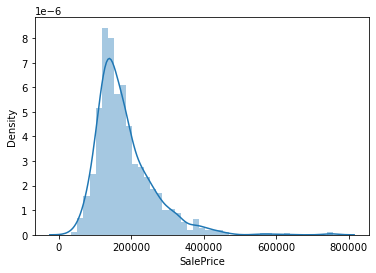

In [50]:
sns.distplot(Y_train)

In [51]:
# Outliers need to be treated. for this purpose, we will find Inter Quartile Range (IQR = diff of 25th and 75th percentile)
# Checking presence of outliers
outliers_percentage={}
numeric_house_dataset = X_train.select_dtypes(include=['int64', 'float64'])

for feature in numeric_house_dataset.columns:
    if feature not in ['SalePrice','YearBuilt','OverallCond', 'OverallQual', 'BsmtFullBath', 'BsmtHalfBath', 'HalfBath', 'FullBath', 'MoSold', 'Yrsold']:
        IQR=numeric_house_dataset[feature].quantile(.75)-numeric_house_dataset[feature].quantile(.25)
        outliers_count=numeric_house_dataset[(numeric_house_dataset[feature]>(numeric_house_dataset[feature].quantile(.75)+1.5*IQR)) | (numeric_house_dataset[feature]<(numeric_house_dataset[feature].quantile(.25)-1.5*IQR))].shape[0]
        outliers_percentage[feature]=round(outliers_count/numeric_house_dataset.shape[0]*100,2)

outlier_df=pd.DataFrame({'Features':list(outliers_percentage.keys()),'Percentage':list(outliers_percentage.values())})
outlier_df.sort_values(by="Percentage", ascending=False)

,Features,Percentage
22,EnclosedPorch,14.79
6,BsmtFinSF2,11.66
1,LotFrontage,8.72
24,ScreenPorch,7.74
0,MSSubClass,7.54
4,MasVnrArea,7.44
14,KitchenAbvGr,5.29
21,OpenPorchSF,5.00
2,LotArea,4.70
8,TotalBsmtSF,4.51


In [20]:
for feature, percent in outliers_percentage.items():
    if percent > 0:
        print(feature)
        IQR = X_train[feature].quantile(.75) - X_train[feature].quantile(.25) 
        max_value = X_train[feature].quantile(.75)+1.5*IQR
        min_value = X_train[feature].quantile(.25)-1.5*IQR

MSSubClass
LotFrontage
LotArea
MasVnrArea
BsmtFinSF1
BsmtFinSF2
BsmtUnfSF
TotalBsmtSF
1stFlrSF
2ndFlrSF
LowQualFinSF
GrLivArea
BedroomAbvGr
KitchenAbvGr
TotRmsAbvGrd
Fireplaces
GarageYrBlt
GarageCars
GarageArea
WoodDeckSF
OpenPorchSF
EnclosedPorch
3SsnPorch
ScreenPorch
PoolArea
MiscVal


#### all of the baove features have outliers. ut they cannot be dropped as critical information can be lost.
#### for this purpose, we have calculated min and max values and it will be assinged to those values outside of 25th and 75th percentile boundary.

### Have to stop here due to computer issues. 